# Conjugate Gradient (CG)

<div style="width: 100%; overflow: hidden;">
     <div style="width: 75%; float: left;">
         <p>
         The Conjugate Gradient (CG) is an algorithm solving linear equation systems in an iterative manner. In this notebook it used to demonstrate de-blurring of an image suffering from optical defocus.
         </p>
         <br>
         <img src="./img/cg-fit_anim.gif" style="width:450px;text-align:left;vertical-align: middle;"/><br>
         last update: 02/05/2022
     </div>
     <div style="margin-left: 80%;">
        <b>Author</b><br><br>
        <a href='http://www.christopherhahne.de', style="text-decoration: None; text-align: left;">
            <img align="left" src="http://www.christopherhahne.de/images/about.jpg" width="78"/>
            <br><br><br><br><br><br>
            <b>Christopher<br>Hahne, PhD</b>
        </a>
    </div>
</div>

### Data preparation

At the beginning we load an picture showing the Swiss alps which crisp high frequency features. To mimic optical defocus, we convolve the ground-truth image with the Point-Spread Function (PSF), which represents the impulse response of an objective lens and is typically used to model the interferrence of propagating light waves.

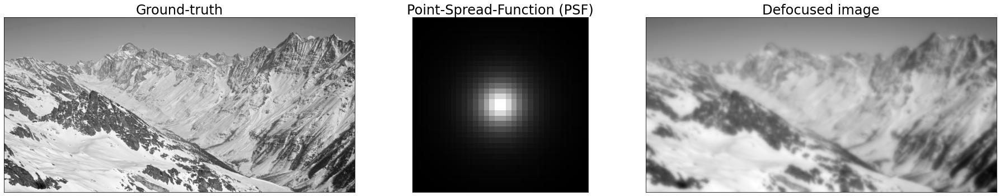

In [1]:
from pathlib import Path
import imageio
from scipy.ndimage import convolve
from utils.gibson_lanni import create_psf_kernel

psf_kernel = create_psf_kernel(size=64)[..., -23][16:-16, 16:-16]

path = Path('.') / 'img' / 'alps.png'
gimg = imageio.imread(str(path)).astype('float')

psf_conv = lambda img, kernel=psf_kernel: convolve(img, kernel, mode='reflect', cval=0.0, origin=0)

# blur image
bimg = psf_conv(gimg)

import matplotlib.pyplot as plt
%matplotlib inline
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(25, 5))
axs[0].imshow(gimg, cmap='gray')
axs[1].imshow(psf_kernel, cmap='gray')
axs[2].imshow(bimg, cmap='gray')
axs[0].set_title('Ground-truth', fontsize=24)
axs[1].set_title('Point-Spread-Function (PSF)', fontsize=24)
axs[2].set_title('Defocused image', fontsize=24)
axs[0].tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False)
axs[1].tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False)
axs[2].tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False)
fig.tight_layout()

### Optimization

Our goal in this notebook is to counteract the lens blur and retrieve image information by means of the Conjugate Gradient (CG) algorithm. The objective function in CG writes

$$
\text{arg min}_{\mathbf{x}} \, \frac{1}{2}\mathbf{x}^{\intercal}\mathbf{A}\mathbf{x}−\mathbf{b}^{\intercal}\mathbf{x}+\mathbf{c}
$$

where $\mathbf{A}\in\mathbb{R}^{n\times n}$ is symmetric, positive-definite, $\mathbf{b}\in\mathbb{R}^n$ is the observation and $\mathbf{x}\in\mathbb{R}^n$ is the solution. The derivation can be found at the end of this notebook.


### Conjugate Gradient Algorithm

For the vanilla version of the CG algorithm, the variable assignment at each update step $k$ shown hereafter. The gain $\alpha_k$ is a scalar given by

$$
\alpha_k = \frac{\mathbf{r}_k^{\intercal} \mathbf{r}_k}{\mathbf{d}_k^{\intercal} \mathbf{A}\mathbf{d}_k}
$$

and used in the solution update $\mathbf{x}_{k+1}$, which writes

$$
\mathbf{x}_{k+1} = \mathbf{x}_k + \alpha_k \mathbf{d}_k  
$$

where $\mathbf{d}_k$ is the direction vector. The residuals $\mathbf{r}_{k}$ are computed via

$$
\mathbf{r}_{k+1} = 
    \begin{cases}
        \mathbf{r}_k-\alpha_k\mathbf{A}\mathbf{d}_k & \quad \text{if } \mod(k, 10) \neq 0\\
        \mathbf{b}-\mathbf{A}\mathbf{x}_k           & \quad \text{otherwise}
    \end{cases}
$$

which allows for actual residual inference every now and then to mitigate round-off erros by using the condition from $k$. The CG algorithm comes with another gain denoted by $\beta_k$

$$
\beta_{k+1} = \frac{\mathbf{r}_{k+1}^{\intercal} \mathbf{r}_{k+1}}{\mathbf{r}_{k}^{\intercal} \mathbf{r}_{k}}
$$

which helps obtain the direction vector $\mathbf{d}_k$ by

$$
\mathbf{d}_{k+1} = \mathbf{r}_{k+1} \beta_k \mathbf{d}_k
$$

using the residuals. An implementation of this procedure is provided below.

In [2]:
def conjugate_gradient(A: callable, b, x = None, rtol: float = 1e-1, max_iter:int=50):
    """
    Conjugate Gradient implementation based on Numpy arrays.

    :param A: function that computes estimate
    :param b: observation
    :param x: initial guess
    :return: x_list
    """

    x = b.copy() if x is None else x
    d = r = b - A(x)
    x_list = [(x.copy()-x.min())/(x.max()-x.min())]

    while len(x_list) < max_iter:

        alpha = (r.ravel().T @ r.ravel()) / (d.ravel().T @ A(d).ravel())
        if alpha < 0: print(f"matrix is not symmetric, positive-definite such that convergence may fail")
        x = x + alpha * d
        if len(x_list) % 10 == 0:
            # compute exact residual to mitigate round-off errors
            r_new = b - A(x)
            d = r
        else:
            r_new = r - alpha * A(d)
        beta = (r_new.ravel().T @ r_new.ravel()) / (r.ravel().T @ r.ravel())
        d = r_new + beta * d
        r = r_new
        
        x_list.append((x.copy()-x.min())/(x.max()-x.min()))

        # see if residual norm below tolerance
        r_norm = (r.flatten() @ r.flatten())**.5
        if r_norm < rtol:
            break

    return x_list

In [3]:
x_cg_list = conjugate_gradient(psf_conv, b=bimg.copy(), max_iter=14)

### Results

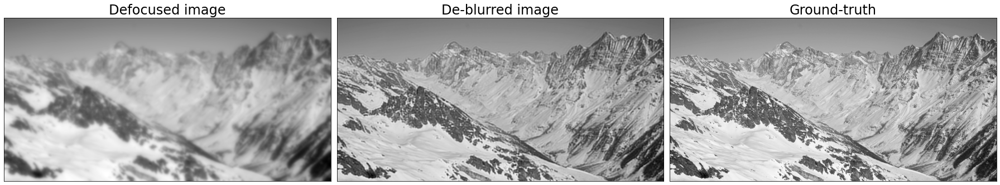

In [4]:
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(25, 5))
axs[0].imshow(bimg, cmap='gray')
axs[1].imshow(x_cg_list[-1], cmap='gray')
axs[2].imshow(gimg, cmap='gray')
axs[0].set_title('Defocused image', fontsize=24)
axs[1].set_title('De-blurred image', fontsize=24)
axs[2].set_title('Ground-truth', fontsize=24)
axs[0].tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False)
axs[1].tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False)
axs[2].tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False)
fig.tight_layout()

CGA yields an error of 860547.338715539 after 14 iterations.


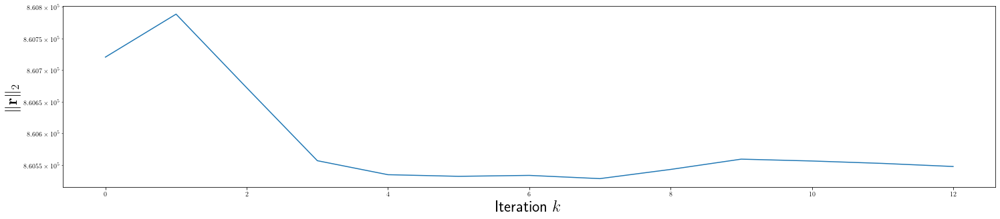

In [5]:
r_norm = lambda r: (r.flatten() @ r.flatten())**.5
eps_cg_list = [r_norm(bimg - psf_conv(x_cg_list[i])) for i in range(len(x_cg_list))]
print('CGA yields an error of %s after %s iterations.' % (round(eps_cg_list[-1], 9), len(x_cg_list)))

from matplotlib import rc
rc('text', usetex=True)
#rc('font', **{'family' : "sans-serif"})
params= {'text.latex.preamble': r'\usepackage{amsmath}'}
plt.rcParams.update(params)
fig, ax = plt.subplots(figsize=(25, 5))
ax.semilogy(eps_cg_list[1:])
ax.set_ylabel(r'$\lVert\mathbf{r}\rVert_2$', fontsize=24)
ax.set_xlabel(r'Iteration $k$', fontsize=24)
plt.show()

### Animation

In [6]:
imageio.mimwrite(path.parent / 'cg-fit_anim.gif', [(255*img[::3, ::3]).astype('uint8') for img in x_cg_list], format= '.gif', fps = 4)

In [7]:
def cg_iterations_anim(x_list, save_opt=False, style_opt=False):

    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(25, 8))
    canvas = ax.imshow(x_list[0], cmap='gray', vmin=0, vmax=1)
    #txt = ax.text(3, 7, r'Iteration # %s' % str(0), fontsize=18)
    fig.tight_layout()

    def update(i):

        canvas.set_data(x_list[i])
        #txt.set_text(r'Iteration # %s' % str(i))

        return canvas,
    
    import matplotlib as mpl
    if style_opt:
        mpl.rcParams['savefig.facecolor'] = '#148ec8'
        fig.set_facecolor('#148ec8')
        for ax in axs:
            ax.set_facecolor('#148ec8')
            ax.set_title(label=ax.get_title(), fontdict={'color': 'white', 'size': 24}, y=1.0)
            ax.spines['bottom'].set_color('white')
            ax.spines['top'].set_color('white')
            ax.spines['left'].set_color('white')
            ax.spines['right'].set_color('white')
            ax.xaxis.label.set_color('white')
            ax.yaxis.label.set_color('white')
            ax.tick_params(colors='white')
            try:
                ax.zaxis.label.set_color('white')
                ax.w_xaxis.line.set_color("white")
                ax.w_yaxis.line.set_color("white")
                ax.w_zaxis.line.set_color("white")
            except:
                pass
    else:
        mpl.rcParams['savefig.facecolor'] = '#ffffff'
        fig.set_facecolor('#ffffff')
        for ax in axs:
            ax.set_title(label=ax.get_title(), fontdict={'color': 'black', 'size': 24}, y=1.0)
    
    from matplotlib import animation
    anim = animation.FuncAnimation(fig, update, frames=len(x_list), interval=200)
    plt.tight_layout()
    plt.close()
            
    if save_opt:
        anim.save('./img/cg-fit_anim.gif', writer='imagemagick')

    return anim

from IPython.display import HTML
anim = cg_iterations_anim(x_cg_list, save_opt=False)
HTML(anim.to_jshtml())

### Derivation

$$
f(\mathbf{x}) = \frac{1}{2}\mathbf{x}^{\intercal}\mathbf{A}\mathbf{x}−\mathbf{b}^{\intercal}\mathbf{x}+\mathbf{c}
$$

$$
\frac{\partial f(\mathbf{x})}{\partial \mathbf{x}} = \frac{1}{2}\left(\mathbf{A}^{\intercal}+\mathbf{A}\right)\mathbf{x}−\mathbf{b}
$$

which is compressed to

$$
\frac{\partial f(\mathbf{x})}{\partial \mathbf{x}} = \mathbf{A}\mathbf{x}−\mathbf{b}
$$

as $\mathbf{A}$ is symmetric such that $\mathbf{A}^{\intercal}+\mathbf{A} = 2\mathbf{A}$. If we set the gradient to zero, we obtain

$$
\mathbf{b} = \mathbf{A}\mathbf{x} \quad\quad \text{if} \quad \frac{\partial f(\mathbf{x})}{\partial \mathbf{x}}=\mathbf{0}  
$$

such that we write the initial residuals $\mathbf{r}_0$ as

$$
\mathbf{r}_0 = \mathbf{b} - \mathbf{A}\mathbf{x}_0
$$